# BME 133 Lab 10

To begin, create a copy of this file using File -> Save as... and name the new file "Lab_10_LastName_FirstName.ipynb" using your last and first name.  Make sure to execute all the code cells in the notebook and that the outputs show in your report. *Two points are allocated for reading and running the code blocks*. Before submitting, remember to add a collaboration statement in this mark down indicating the contribution of each member. You may edit the template below:

- Rohit Bhogal - 011221171: Did problems 7 - 9
- Neha Raj - 018968170: Did problems 7 - 9
- Dania Abuirbaleh - 018756387: Did problems 1 - 6

    Then went over it together as a group

This Lab will cover the basics of image import and handling.

Materials for this lab are adapted from a series of Jupyter Notebooks by Guillaume Witz, © Copyright 2021. Who expressly permits use of this material for learning and teaching. The original notebooks can be found on [Github](https://guiwitz.github.io/PyImageCourse_beginner/README.html).

The images come from the [Cell Atlas](https://www.proteinatlas.org/humanproteome/cell). For more information see the publication of Thul PJ et al., A subcellular map of the human proteome. Science. (2017) DOI: [10.1126/science.aal3321](https://doi.org/10.1126/science.aal3321). All images are covered by a [Creative Commons Attribution-ShareAlike 3.0 International License](https://creativecommons.org/licenses/by-sa/3.0/).

## Package Installation and Import

This lab requires opencv which does not come preinstalled with Anaconda and for which anaconda installation can fail. So we have to use a combination of Anaconda and Pip. In such circumstances, and in general when there are dependencies you wish to isolate from your main conda environment, it is highly recommended to install your packages seperately in a new conda environment. Since this is a new environment, you will need to install the other packages needed in the lab. 

1. Open Anaconda Prompt, and create a new lab9 virtual environment: `conda create --name lab9`
2. Activate your lab9 virtual enviromment using: `conda activate lab9`. 
3.  [Skimage](https://scikit-image.org/) (Scikit-Image) supports image processing applications in Python. Install scikit-image in lab9 environment: `conda install -n lab9 scikit-image`
4. Install Matplot-lib in lab9 environment: `conda install matplotlib`
5. Install pip in lab9 environment (to be able to install opencv): `conda install -n lab9 pip`
6. [CV2](https://opencv.org/) (the current version of OpenCV) performs computer vision tasks. Install with: `pip install opencv-contrib-python`
7. Restart VSC and make sure you're running this Jupyter notebook in the lab9 virtual environment we created using Anaconda.

>A special note on Computer Vision Libraries: While CV2 may be more popular than Skimage, CV2 reads images in BGR format instead of the standard RGB. It is extremely important to recognize what colorspace is used by the computer vision tools you are using. Additionally, I highly recommend the tutorials at [Datacarpentry](https://datacarpentry.org/image-processing/) for Skimage and image processing in general.

After you're sure each of the above is installed in your lab9 environment, try running the code cell below. If a module isn't recognized, check your conda environment again to see if it's installed.

In [42]:
import numpy as np
from skimage import io
import cv2
import matplotlib.pyplot as plt

## Images as Arrays

We import now an image from an online microscopy repository, using an url. This is fluorescence microscopy image of Saccharomyces cerevisiae with a signal accumulating in the vacuoles.

In [43]:
# image = io.imread('13901.tif')
image = io.imread('https://cildata.crbs.ucsd.edu/media/images/13901/13901.tif')
image

array([[219, 225, 220, ..., 256, 258, 272],
       [218, 211, 217, ..., 270, 268, 278],
       [217, 217, 214, ..., 263, 268, 262],
       ...,
       [337, 343, 321, ..., 266, 287, 285],
       [320, 323, 339, ..., 268, 295, 281],
       [329, 353, 335, ..., 276, 281, 291]],
      shape=(1024, 1360), dtype=uint16)

In [44]:
type(image)

numpy.ndarray

As the type tells us, and as we can see from the output, the import function returned to us a Numpy ndarray or just array. nd stands for n-dimensional as Numpy can handle data of any dimension. The above output only shows us a fraction of the image the ```...``` indicating non-displayed values.

As we have seen from our study of Python objects: they also have functions (methods) and properties. This is true for Numpy arrays. For example we can ask what is the shape of the array:

In [45]:
image.shape

(1024, 1360)

These numbers tell us that our array has 1024 lines and 1360 columns. In the above output we also see an indication ```dtype```. This tells us what is the type of the pixels inside the array. The variable ```image``` is an array but its content can vary: we could have floating point values, integers etc. here ```uint16``` tells us we have unsigned (no negative values) integers in 16 bit, i.e. up to $2^{16}$ different possible pixel values.

We have seen in the introduction that we could display the image using the ```imshow``` function. Let's do it here:

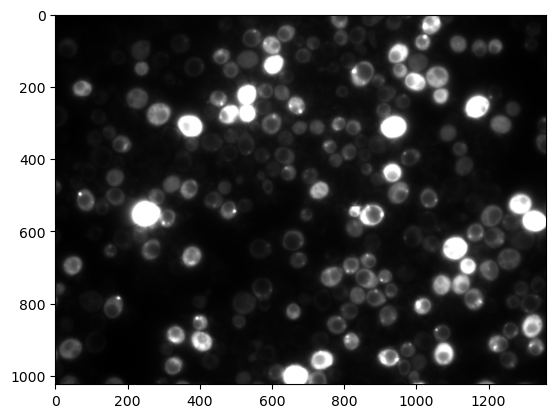

In [46]:
plt.imshow(image, cmap='gray')

In addition to the ```image``` input we also used an *optional* parameter called ```cmap``` here and that allows us to set a certain colormap, here a gray one. You can find more here: https://matplotlib.org/stable/tutorials/colors/colormaps.html#sequential

## Accessing values

We can again display part of the array:

In [47]:
image

array([[219, 225, 220, ..., 256, 258, 272],
       [218, 211, 217, ..., 270, 268, 278],
       [217, 217, 214, ..., 263, 268, 262],
       ...,
       [337, 343, 321, ..., 266, 287, 285],
       [320, 323, 339, ..., 268, 295, 281],
       [329, 353, 335, ..., 276, 281, 291]],
      shape=(1024, 1360), dtype=uint16)

The first questions is: how do we extract a certain value from the array? Each of the numbers we see above represents a pixel and it has a location (row, column). We can use that location to "extract" the value from the array. For example if we want the top left pixel at ```row=0``` and ```column=0``` we **square brackets** (indexing) to call these coordinates:

In [48]:
image[0,0]

np.uint16(219)

We can now even change that value by reassigning another one:

In [49]:
image[0,0] = 2

In [50]:
image

array([[  2, 225, 220, ..., 256, 258, 272],
       [218, 211, 217, ..., 270, 268, 278],
       [217, 217, 214, ..., 263, 268, 262],
       ...,
       [337, 343, 321, ..., 266, 287, 285],
       [320, 323, 339, ..., 268, 295, 281],
       [329, 353, 335, ..., 276, 281, 291]],
      shape=(1024, 1360), dtype=uint16)

We see that we have indeed changed the value of that top left pixel!

## Accessing parts of the array

Very often we don't need to access a single pixel, but an entire region. In other terms we want to **crop** the image. Let's look again at the image:

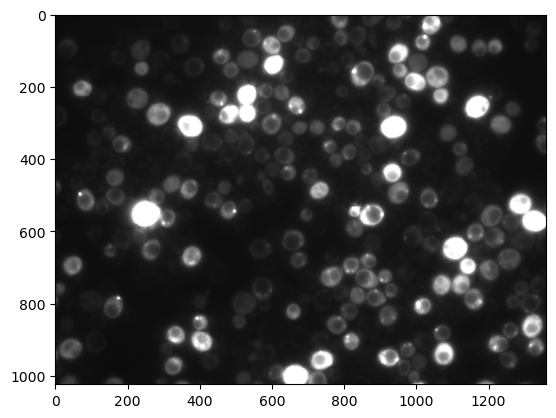

In [51]:
plt.imshow(image, cmap='gray')

Let's say we want to focus our attention on a region in the middle of the image. We can for example take the rows 400-530 and columns 400-600. Instead of just using single coordinates we can now extract that part of the image using a **range** of pixels, the range being indicated via the ```:``` symbol. Here we write:

In [52]:
image[400:530, 400:600]

array([[375, 352, 370, ..., 470, 452, 469],
       [372, 368, 365, ..., 462, 458, 472],
       [381, 370, 359, ..., 478, 461, 480],
       ...,
       [349, 365, 346, ..., 287, 285, 290],
       [333, 349, 340, ..., 288, 276, 275],
       [355, 351, 337, ..., 282, 274, 267]],
      shape=(130, 200), dtype=uint16)

We can store this new smaller array into a new variable:

In [53]:
cropped = image[400:530, 400:600].copy()

**Note that we additionally use here the ```copy``` method. This ensures that whatever modification we make to the cropped version doesn't affect the original image!**.

We can again plot this cropped image:

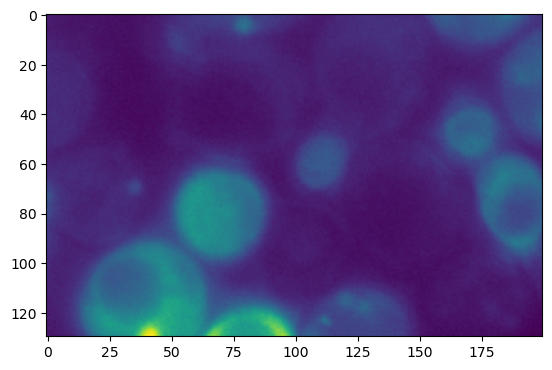

In [54]:
plt.imshow(cropped)

We can also check again the size of this cropped image. We expect 130 rows and 200 columns:

In [55]:
cropped.shape

(130, 200)

If instead of selecting both rows and columns we only want to select a range of rows and take **all** columns, we can just use ```:``` alone:

In [56]:
image[400:530, :].shape

(130, 1360)

We can also leave out the *end* boundary and then it takes all the rows/columns from a certain index to the last one:

In [57]:
image[400:, :].shape

(624, 1360)

## Numpy operations on images
We can process images as arrays. The advantage of the array representation is that we can do mathematics as if we were using plain numbers.  For example we can write the mathematical statement $y = x + 3$, and we can write the same thing with an entire array:

In [58]:
cropped_plus_three = cropped + 3

In [59]:
cropped_plus_three

array([[378, 355, 373, ..., 473, 455, 472],
       [375, 371, 368, ..., 465, 461, 475],
       [384, 373, 362, ..., 481, 464, 483],
       ...,
       [352, 368, 349, ..., 290, 288, 293],
       [336, 352, 343, ..., 291, 279, 278],
       [358, 354, 340, ..., 285, 277, 270]],
      shape=(130, 200), dtype=uint16)

In [60]:
cropped

array([[375, 352, 370, ..., 470, 452, 469],
       [372, 368, 365, ..., 462, 458, 472],
       [381, 370, 359, ..., 478, 461, 480],
       ...,
       [349, 365, 346, ..., 287, 285, 290],
       [333, 349, 340, ..., 288, 276, 275],
       [355, 351, 337, ..., 282, 274, 267]],
      shape=(130, 200), dtype=uint16)

We see that the statement ```cropped + 3``` is turned by Numpy into "add the value 3 to each pixel in the array called ```cropped```. This allows us to increase the intesity of each pixel by one instead of having to do it pixel by pixel!

We can use numpy functions that *summarize* the array to get summary data about our image. For example we can find the maximum or minumum intensity in the image:

In [61]:
np.max(cropped)

np.uint16(1568)

In [62]:
np.min(cropped)

np.uint16(267)

Finally note, that some of these functions are also available as **methods** attached to the Array object itself. The two following lines are completely equivalent:

In [63]:
np.mean(cropped)

np.float64(472.93142307692307)

In [64]:
cropped.mean()

np.float64(472.93142307692307)

### Operations between arrays

Above we have only seen operations that use a *single* array and that either modified the array or calculated some statistic. But we can also **combine** arrays in different ways, for example we can add two arrays. Again the operation happens **element-wise** and because of this we have to ensure that the two arrays have the **same dimensions**. If they don't Numpy doesn't know what to do with values that don't have an equivalent in the other array.

As we are studying image processing, let's simulate noise in our image. We will take our ```cropped``` and add to it some noise (this is commonly done to test algorithms in degraded conditions). Let's use again Poisson noise. Now we need to make sure that we create a noise-image that has the correct dimensions. Those are:

In [65]:
cropped.shape

(130, 200)

Now we can use that shape when creating the noise-array:

In [66]:
noise_image = np.random.poisson(lam=3, size=cropped.shape)

Now we simply add the ```cropped``` image and the ```noise_image```:

In [67]:
corrupted = cropped + 100*noise_image

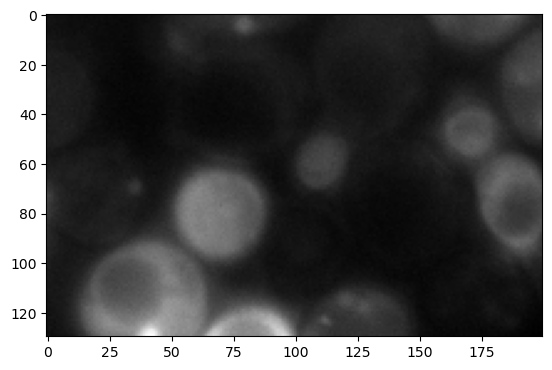

In [68]:
plt.imshow(cropped, cmap='gray');

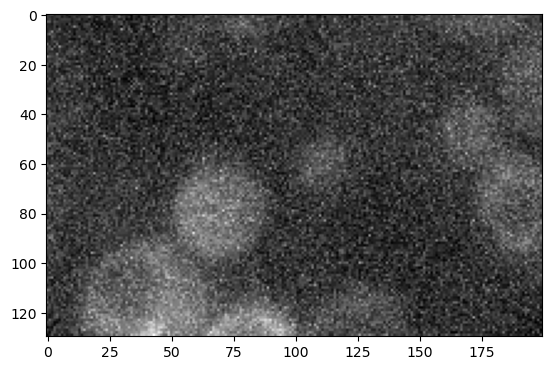

In [69]:
plt.imshow(corrupted, cmap='gray');

You can essentially use all common mathematical operations with arrays of same size.

## Logical operations and indexing

In previous Lab exercises, we have discussed the **boolean** data type and using operators to create logical statements that evaluate to boolean value, such as $a > 3$. Boolean means that this is a variable that can only take on two values: True or False (or 1 and 0). Now we can do the same thing with Numpy arrays:

In [70]:
cropped

array([[375, 352, 370, ..., 470, 452, 469],
       [372, 368, 365, ..., 462, 458, 472],
       [381, 370, 359, ..., 478, 461, 480],
       ...,
       [349, 365, 346, ..., 287, 285, 290],
       [333, 349, 340, ..., 288, 276, 275],
       [355, 351, 337, ..., 282, 274, 267]],
      shape=(130, 200), dtype=uint16)

In [71]:
cropped > 450

array([[False, False, False, ...,  True,  True,  True],
       [False, False, False, ...,  True,  True,  True],
       [False, False, False, ...,  True,  True,  True],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]], shape=(130, 200))

We see that the output is again a Numpy array and that it is filled with ```True``` and ```False``` values: we have a **boolean array**. Again the comparison here was done **element wise**: each pixel was compared to the value 450 and the result stored in a new array. As with a simple number we can now save this **boolean array** as a variable:

In [72]:
array_bool = cropped > 450

As we are working with an image, what we have just done here is essentially **thresholding**: we created a binary image where pixels say ```True``` above the intensity threshold and ```False``` otherwise. We can actually plot the result:

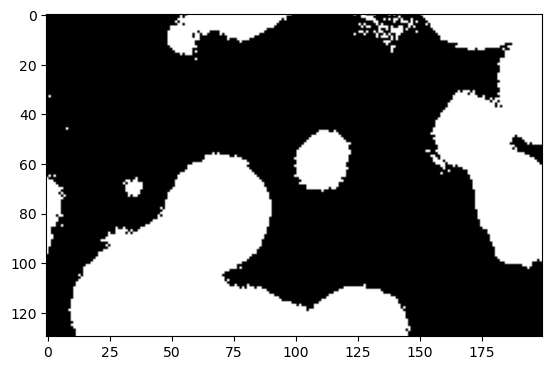

In [73]:
plt.imshow(array_bool, cmap='gray')

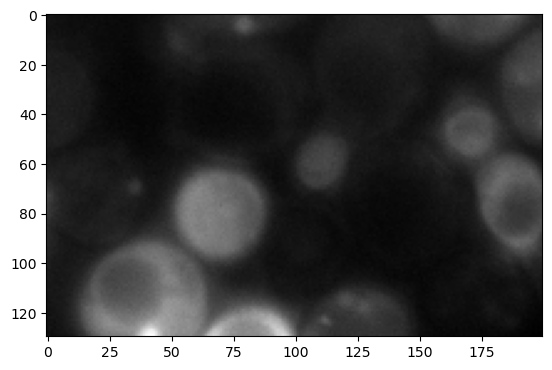

In [74]:
plt.imshow(cropped, cmap='gray')

One very important operation that we can use now is to combine the image with the boolean array **to extract only the ```True``` values** from the image. Imagine using the logical array as a mask, superposing it onto the image and extracting only the pixels that are visible through the white regions. The drawing below explains this concept:

In [75]:
from IPython.display import Image
Image(url='https://github.com/guiwitz/ISDAwPython_day2/raw/master/images/logical_indexing.jpeg',width=700)

This operation is performed by passing the boolean array (the indexing one) to the image in square parentheses:

In [76]:
cropped[array_bool]

array([468, 466, 465, ..., 496, 488, 472], shape=(9117,), dtype=uint16)

As you can see, the output is just 1D array, a list of numbers. Imagine that you want to estimate the average fluorescent intensity in those structures. This is exactly how we would proceed:
1. Find the objects of interest. Here we did it by (bad) manual thresholding
2. Find which pixels belong to these objects. This is done here using the above **logical indexing** ```cropped[array_bool]```
3. Finally compute the average of those values. This can simply be achieved by taking the ```mean``` of the above array:

In [77]:
extracted_pixels = cropped[array_bool]
extracted_pixels.mean()

np.float64(658.8238455632335)

## Multi-dimensional images

When learning about images as arrays, we used an image that was imported as a 2D array:

In [78]:
image = io.imread('https://cildata.crbs.ucsd.edu/media/images/13901/13901.tif')

In [79]:
image.shape

(1024, 1360)

However, very often in microscopy we are using multi-dimensional images: time-lapses, multi-channel, volumes etc. In those cases the imported arrays are not 2 but N-dimensional. Let's for example import the following image:

In [80]:
image_rgb = io.imread('46658_784_B12_1.tif')

In [81]:
image_rgb.shape

(2048, 2048, 3)

The shape of this image has now three values: rows, columns and an additional one. Here this last channel corresponds the multiple channels. We can plot the image to confirm this:

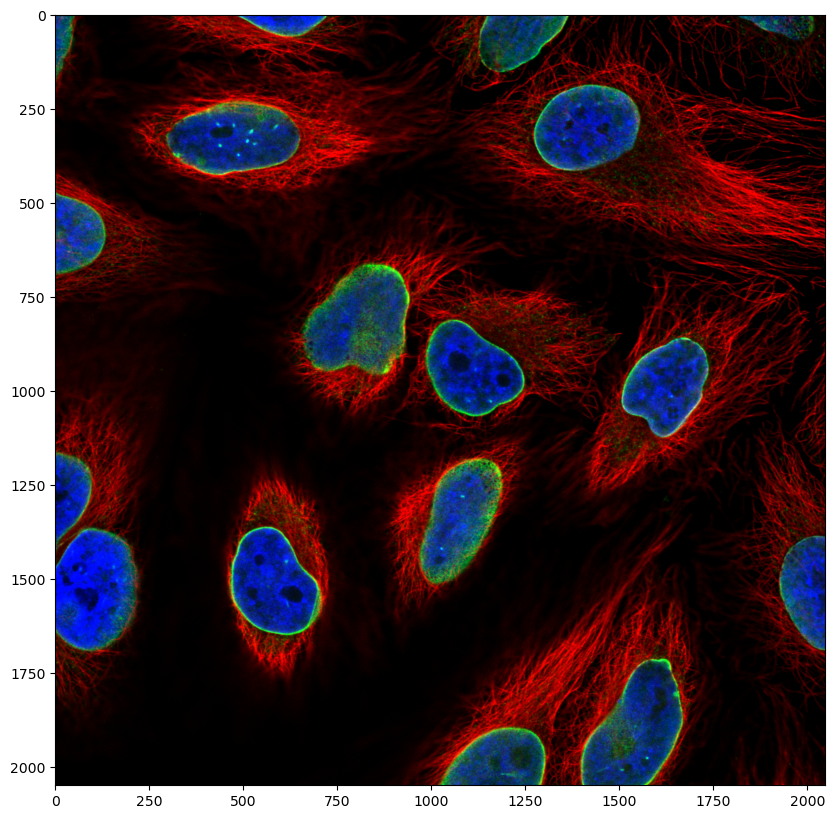

In [82]:
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(image_rgb)

**BEWARE!!!**

If you use OpenCV, by default it imports images in BGR format, not RGB!

In [83]:
image_cv2 = cv2.imread('46658_784_B12_1.tif')


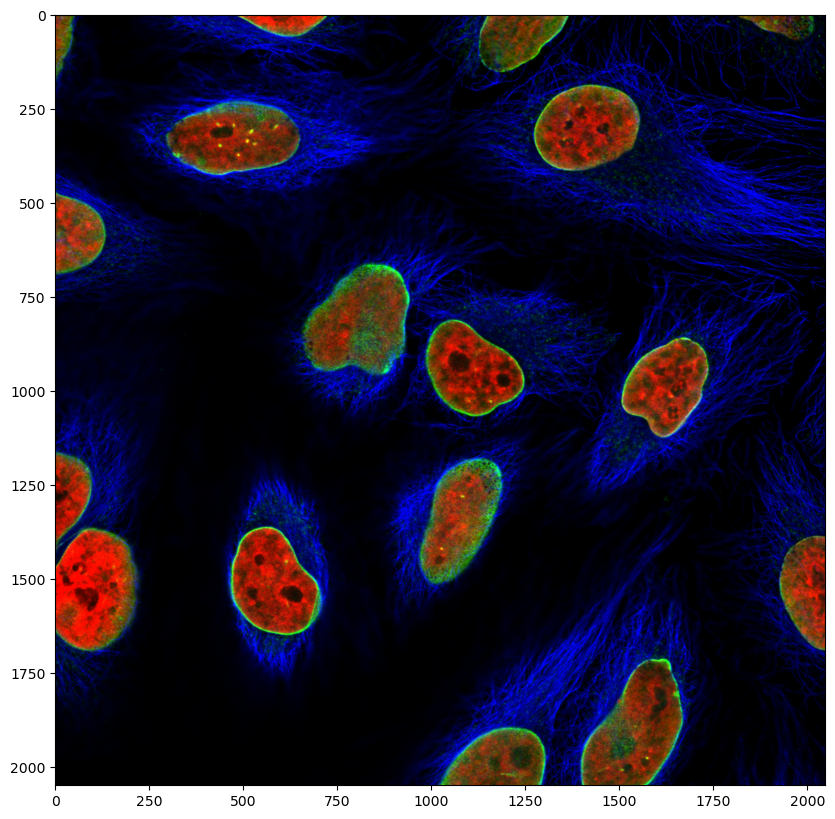

In [84]:
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(image_cv2)

So If you use OpenCV, you'll want to convert the color order before using the image with other libraries.

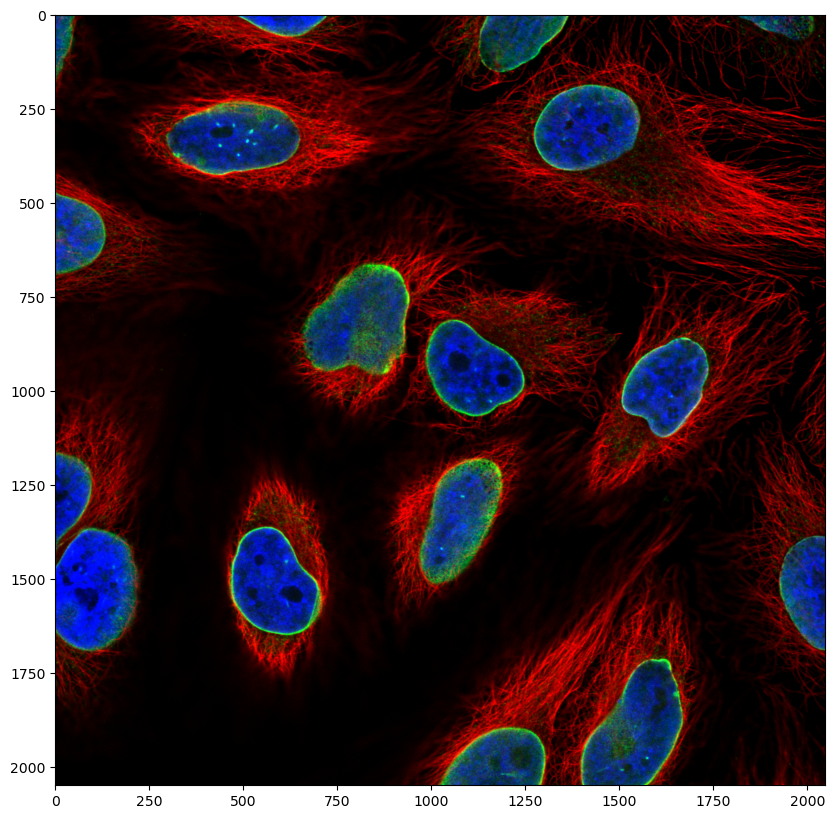

In [85]:
image_cv2_rgb = cv2.cvtColor(image_cv2, cv2.COLOR_BGR2RGB)
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(image_cv2_rgb)

### Splitting channels

When using other software such as ImageJ a very common first step in a processing pipeline is to split the image into separate channels so that they can be processed individually. There is no "splitting function" here, but since we are dealing with an array, we can simply **slice** the array and select only one of the channels. If we want the first channel we need:
- all rows of the first dimension: ```:```
- all columns of the second dimension: ```:```
- the first channel of the third dimension: ```0```

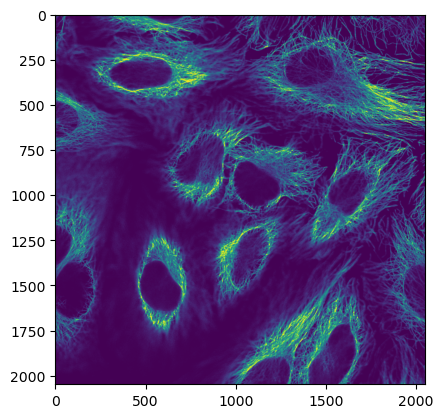

In [86]:
image_channel1 = image_rgb[:, : , 0]
plt.imshow(image_channel1)

And we can repeat this for all channels:

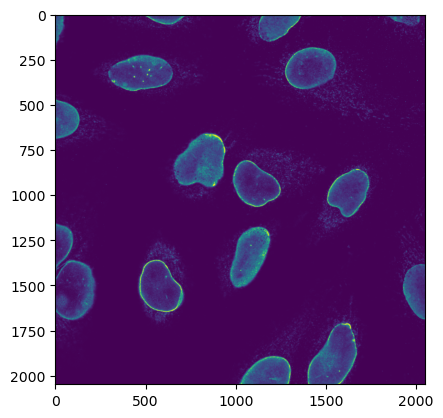

In [87]:
image_channel2 = image_rgb[:, : , 1]
plt.imshow(image_channel2)

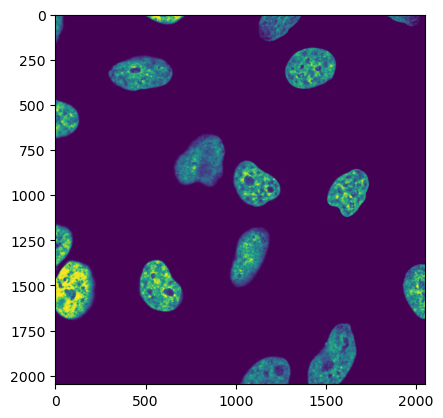

In [88]:
image_channel3 = image_rgb[:, : , 2]
plt.imshow(image_channel3)

You may encounter even higher-dimensional images. For example if you have a volume acquired in multiple channels you will have four dimensions: rows, columns, planes, channels.

If the standard scikit-image importer is not sufficient because you are working with an unrecognized format we recommend to have a look at the [AICSImageIO](https://allencellmodeling.github.io/aicsimageio/) package. It is not as straightforward to use as the simple ```imread``` but more powerful.

## Image histogram

Another very common task is to look at the distribution of pixel intensities in the form of a histogram, i.e. count how many times each pixel value (or range) appears in an image and display it a a bar. This allows to get a quick estimate of the intensities present in an image and to check for problems like saturation.

We have already seen that we could use Matplotlib's ```imshow``` function to display an image. Now we look at a second plotting function from that library which generates such a histogram ```plt.hist()```. We want to compute the histogram on **all pixels** and for that we cannot use our 2D image as input. We first need to **flatten** the image into one long series of number. This can be done with the ```ravel()``` method of the array:

In [89]:
image_channel1.shape

(2048, 2048)

The expected length of the unfolded image is:

In [90]:
2048 * 2048

4194304

In [91]:
image_channel1.ravel().shape

(4194304,)

Now we can pass this unfolded version of the image to the histogram function:

(array([2521915.,  671734.,  373088.,  231058.,  159081.,   99117.,
          63014.,   34935.,   20971.,   19391.]),
 array([  0. ,  25.5,  51. ,  76.5, 102. , 127.5, 153. , 178.5, 204. ,
        229.5, 255. ]),
 <BarContainer object of 10 artists>)

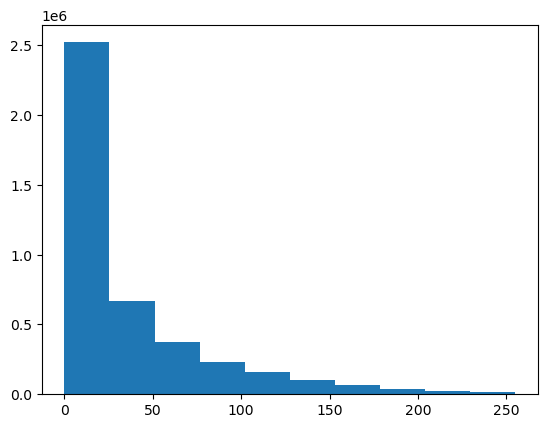

In [92]:
plt.hist(image_channel1.ravel())

Here we see that we have a lot of background pixels (large bin at low values) but we luckily don't observe saturation, which would appear as one large bin on the right.

## Image types

In the above historgram we see that our maximum value is around 250, actually it is:

In [93]:
image_channel1.max()

np.uint8(255)

Has this number any meaning? Let's look at what type of numbers we have inside the array:

In [94]:
image_channel1.dtype

dtype('uint8')

The above output indicates that we have an unsigned 8-bit integer image. This means that the pixels can take all possible values between 0 and $2^8 = 256$ (not included). This is the reason why the maximum possible value in our array is 255.

We have to be somewhat careful with this. Let's look at a small portion of the image by cropping it:

In [95]:
image_channel1[0:3, 0:3]

array([[13, 15, 22],
       [22, 29, 36],
       [14, 22, 25]], dtype=uint8)

Now let us do some operation: we want to remove an estimated background that we here arbitrarily set at 10. We now have to subtract this value from each pixel in the image, so we do:

In [96]:
image_channel1[0:3, 0:3] - 10

array([[ 3,  5, 12],
       [12, 19, 26],
       [ 4, 12, 15]], dtype=uint8)

All is fine, the value 10 has been subtracted from each pixel. Now let's imagine that the background has been estimated to 30:

In [97]:
image_channel1[0:3, 0:3] - 30

array([[239, 241, 248],
       [248, 255,   6],
       [240, 248, 251]], dtype=uint8)

Something strange happened: for example the original value 36 has indeed become 6, but the value 13 has become 239 ?!

The type of our array is 8 bit. This means that it can **only** take values between 0-255. So when we compute 13-30, we **cannot obtain a negative value**. What happens is that instead we subtract first 13, reach the value 0, and then essentially end-up at the other end of the possible range of values which is 255 and then remove additionally 17 and end-up with the value 239.

We can see the strange result of such an operation by plotting:

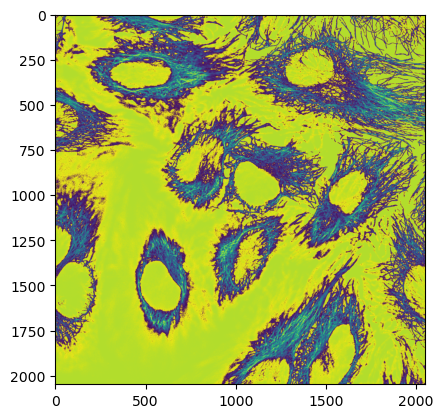

In [98]:
plt.imshow(image_channel1-30)

What can we do to fix this problem ? We have to change the type of our image so that it can accomodate this mathematical operation. For example we can turn it into a float image. For this we use the ```astype``` method:

In [99]:
image_channel1_float = image_channel1.astype(np.float16)

In [100]:
image_channel1_float[0:3, 0:3]

array([[13., 15., 22.],
       [22., 29., 36.],
       [14., 22., 25.]], dtype=float16)

In [101]:
image_channel1_float[0:3, 0:3] - 30

array([[-17., -15.,  -8.],
       [ -8.,  -1.,   6.],
       [-16.,  -8.,  -5.]], dtype=float16)

## Thresholding

When performing logical operations of the type ```image > value``` we have seen that this allowed us to perform **thresholding**, one the basic image processing methods to identify objects in an image. Here we come back to this topic and show how we can automated the threshold selection, combine masks etc.

Let's import the image, plot it and check its dimensions:

In [102]:
#image_stack = io.imread('46658_784_B12_1.tif')
image_stack = io.imread('https://github.com/guiwitz/PyImageCourse_beginner/raw/master/images/46658_784_B12_1.tif')

In [103]:
image_stack.shape

(2048, 2048, 3)

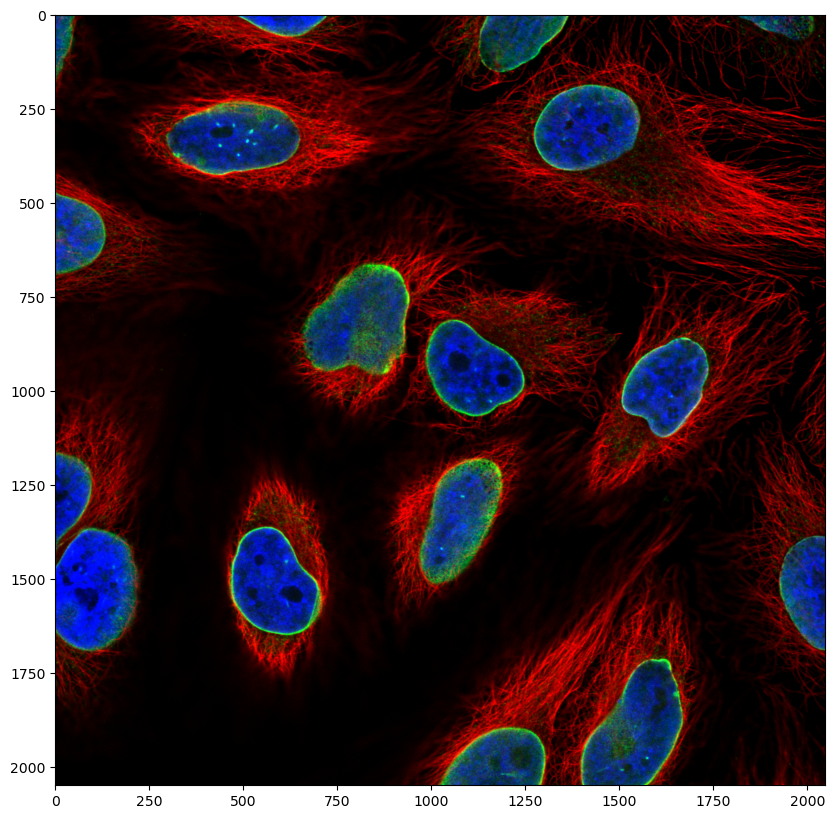

In [104]:
plt.subplots(figsize=(10,10))
plt.imshow(image_stack)

We have again a three channel image, i.e. our image is composed of three planes. For the moment we only want to work with the nuclei, so we isolate that channel, the third one: 

In [105]:
image_nuclei = image_stack[:,:,2]

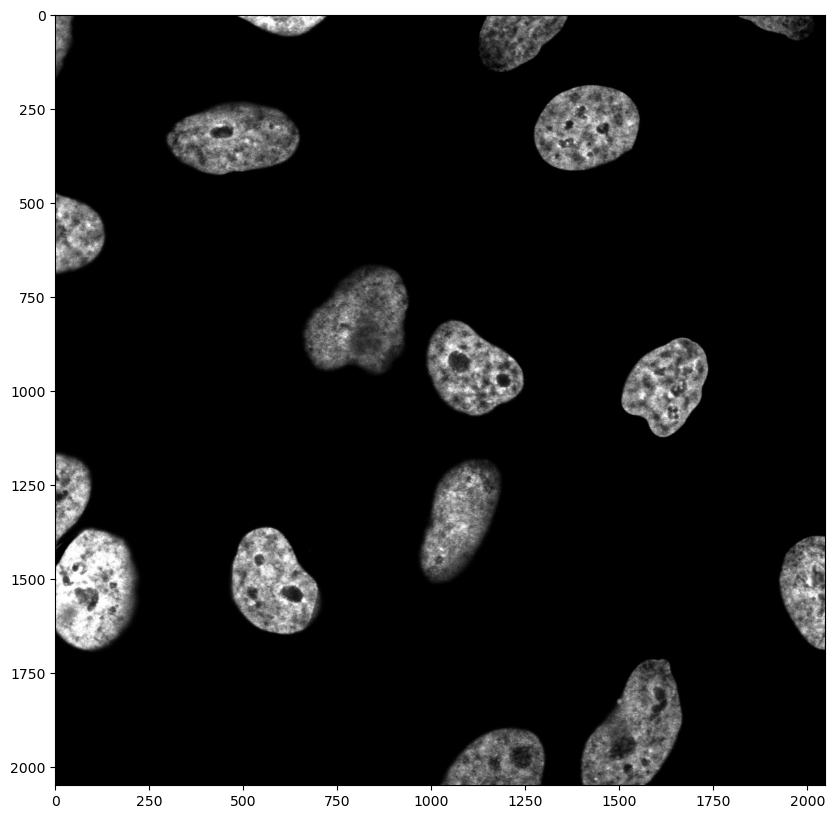

In [106]:
plt.subplots(figsize=(10,10))
plt.imshow(image_nuclei, cmap = 'gray')

## Manual investigation

We have seen in the previous chapter that if we want to isolate nuclei, we have to know more or less what intensity they have so that we can use a cutoff value on pixel intensities. We can look at the histogram of pixel values:

(array([3593317.,   54030.,   87251.,  112196.,  119289.,   89619.,
          60085.,   34064.,   20522.,   23931.]),
 array([  0. ,  25.5,  51. ,  76.5, 102. , 127.5, 153. , 178.5, 204. ,
        229.5, 255. ]),
 <BarContainer object of 10 artists>)

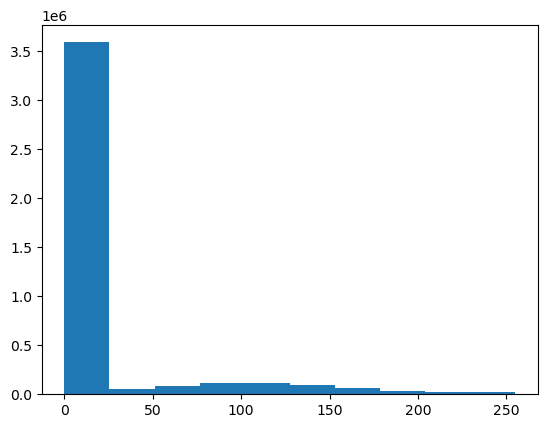

In [107]:
plt.hist(np.ravel(image_nuclei))

Clearly we have background intensity between 0 and ~50, and the signal spread out between 50 and 255. We can create a mask of all the pixels with a value above 50: 

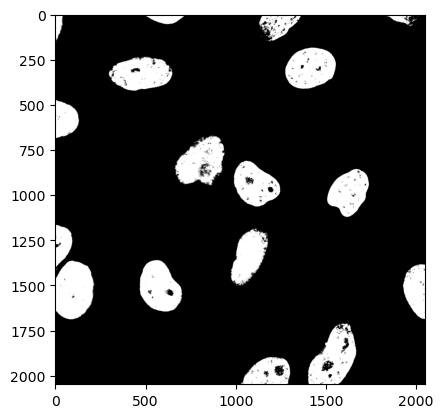

In [108]:
mask = image_nuclei > 50
plt.imshow(mask, cmap = 'gray')

For the sake of the experiment, let's use a higher threshold:

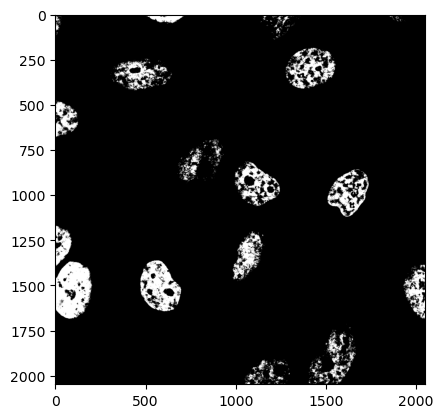

In [109]:
mask = image_nuclei > 120
plt.imshow(mask, cmap = 'gray')

Clearly, if the threshold is too high, we loose import parts of the image.

## Automatic thresholding

Setting a threshold manually is not ideal for two reasons: 
1. Your eyes might fool you
2. If you have to do this operation on 100's of images you don't want to do it by hand.

Several methods have been developed to detect an "ideal" threshold based on the pixel histogram. One of the most famous ones is the Otsu method: it sets a threshold by dividing the pixels in two classes and tries to minimize the variance of both classes.

Such classical algorithms are all implemented in scikit-image and we can just use them out of the box. All algorithms are grouped in logical groups (filtering, measuring etc.) Often the easiest is just to use Google to find them.

For example the [Otsu algorithm](https://www.google.com/search?q=skimage+otsu&oq=skimage+otsu&aqs=chrome..69i57j69i60j0l4.2268j0j7&sourceid=chrome&ie=UTF-8):

In [110]:
from skimage import filters

help(filters.threshold_otsu)

Help on function threshold_otsu in module skimage.filters.thresholding:

threshold_otsu(image=None, nbins=256, *, hist=None)
    Return threshold value based on Otsu's method.

    Either image or hist must be provided. If hist is provided, the actual
    histogram of the image is ignored.

    Parameters
    ----------
    image : (M, N[, ...]) ndarray, optional
        Grayscale input image.
    nbins : int, optional
        Number of bins used to calculate histogram. This value is ignored for
        integer arrays.
    hist : array, or 2-tuple of arrays, optional
        Histogram from which to determine the threshold, and optionally a
        corresponding array of bin center intensities. If no hist provided,
        this function will compute it from the image.


    Returns
    -------
    threshold : float
        Upper threshold value. All pixels with an intensity higher than
        this value are assumed to be foreground.

    References
    ----------
    .. [1] Wikipedia, 

In [111]:
my_otsu_threshold = filters.threshold_otsu(image_nuclei)
print(my_otsu_threshold) 

66


Using that value we can create a new mask:

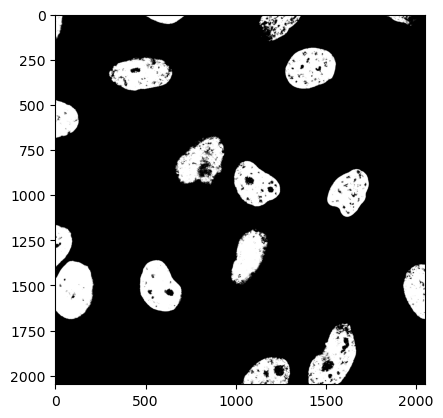

In [112]:
mask_nuclei = image_nuclei > my_otsu_threshold
plt.imshow(mask_nuclei, cmap = 'gray')

## Combining masks

We can do the same thresholding operation on the other channel contained in the image. Let's first "isolate" the first channel (red):

In [113]:
image_cells = image_stack[:,:,0]

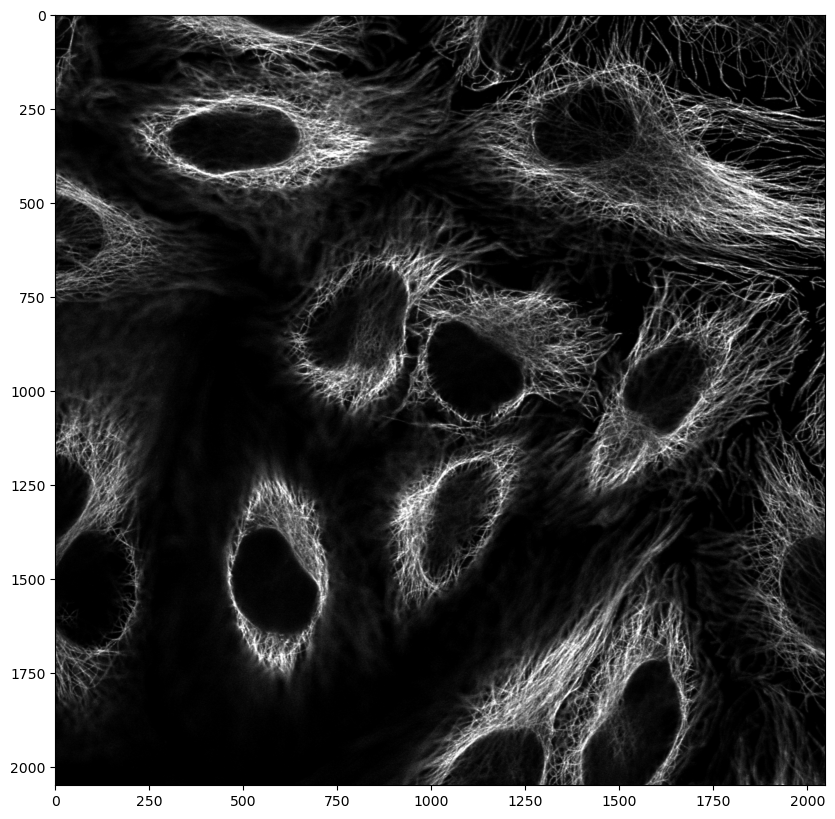

In [114]:
plt.subplots(figsize=(10,10))
plt.imshow(image_cells, cmap = 'gray')

In [115]:
mask_cells = image_cells > filters.threshold_otsu(image_cells)

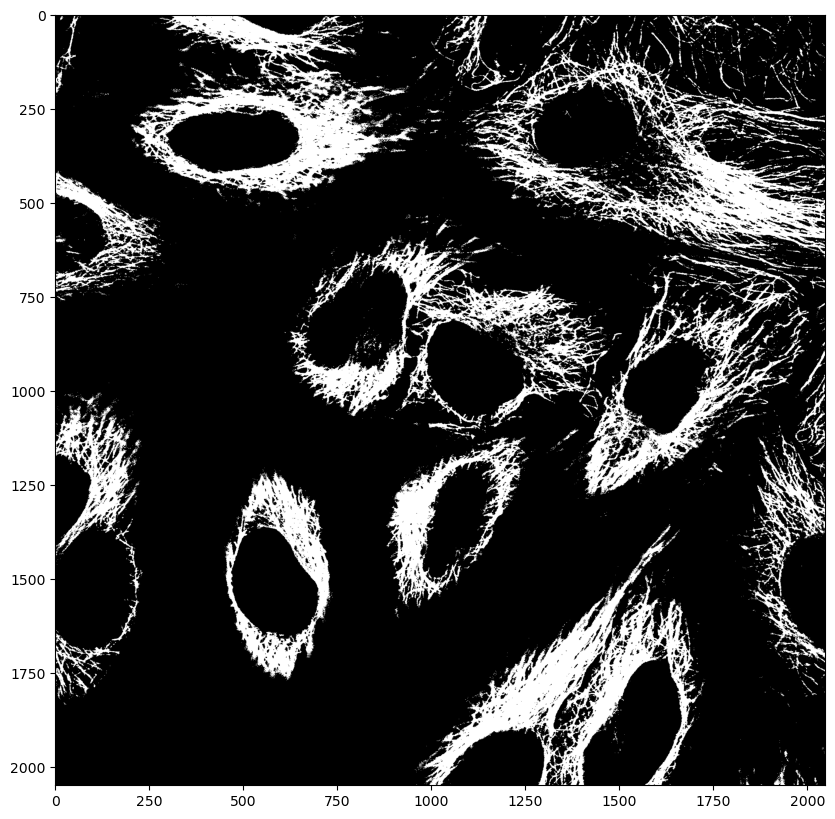

In [116]:
plt.subplots(figsize=(10,10))
plt.imshow(mask_cells, cmap = 'gray')

We can in principle combine masks however we want. For example we can consider pixels that are ON (```True```) in both masks by multiplying them as only ```True x True = True```

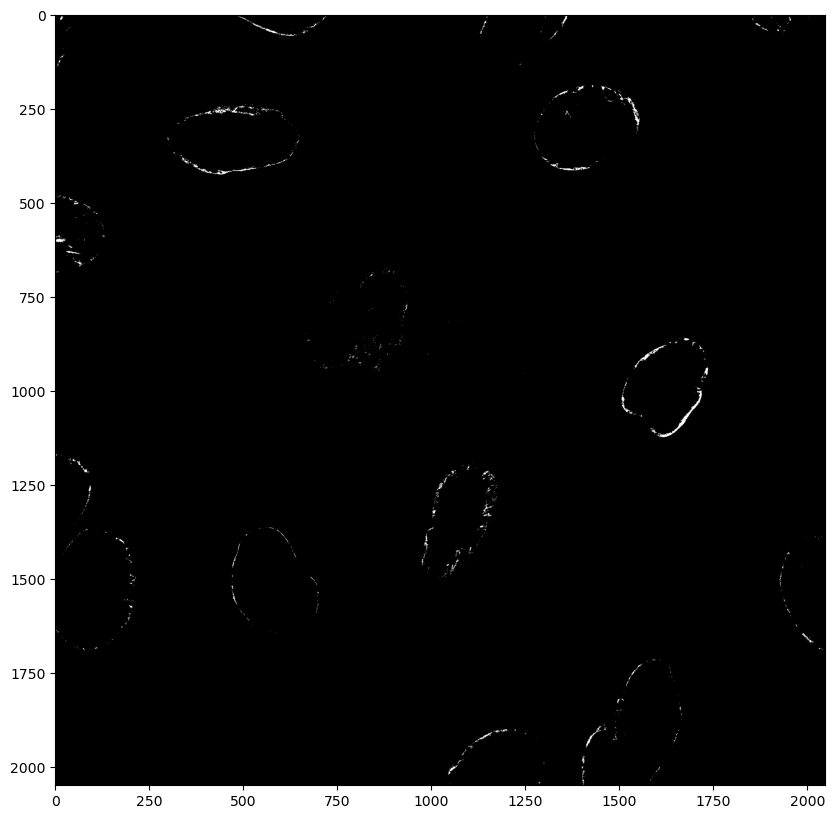

In [117]:
both_masks = mask_cells * mask_nuclei

plt.subplots(figsize=(10,10))
plt.imshow(both_masks, cmap = 'gray')

or we can consider pixels that are ON (```True```) in one **or** the other image by adding them as ```True + False = True```:

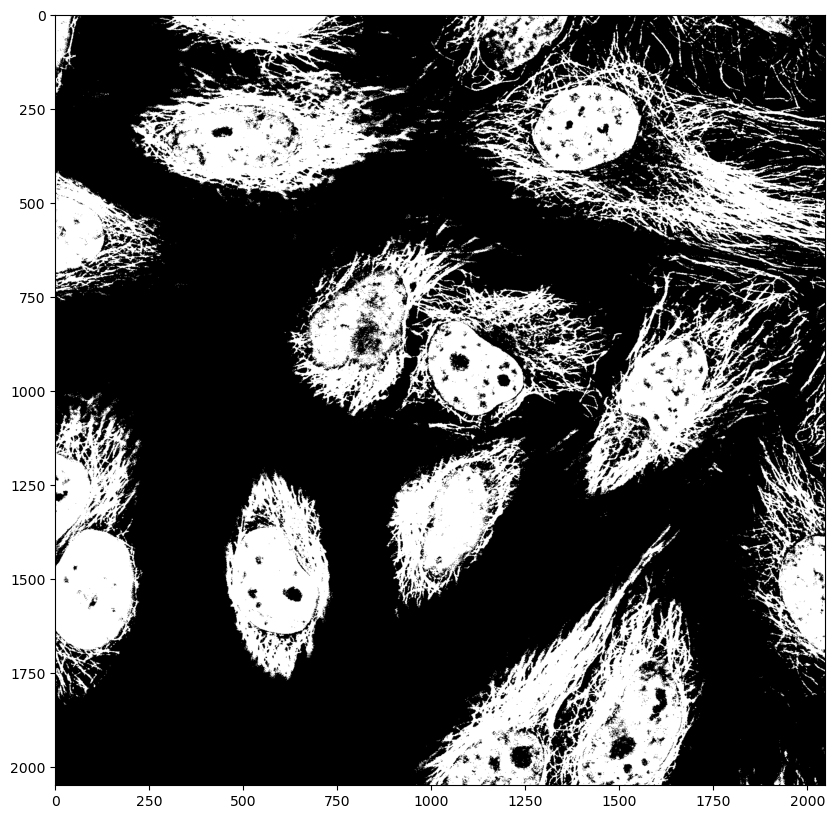

In [118]:
plt.subplots(figsize=(10,10))
plt.imshow(mask_cells + mask_nuclei, cmap = 'gray')

Now that we have **segmented** elements in our image, we want to be able to quantify those elements, which we will do in Part 2 after cleaning them up using binary/morphological operations.

## Exercises

### Ex. 0 (1 pt)

Make sure you downloaded the image `CIL_39053.tif` from Canvas, and that it's in the same directory as this notebook. Open the image using your preferred computer vision library. 

*Source: This image is freely available under a Creative Commons license, Paul Appleton (2011) CIL:39053, Mus musculus, stem cell, goblet cell. CIL. Dataset. https://doi.org/doi:10.7295/W9CIL39053*

In [123]:
image = cv2.imread('39053.tif')
image


array([[[ 11,  11,  11],
        [  8,   8,   8],
        [  1,   1,   1],
        ...,
        [  1,   1,   1],
        [  4,   4,   4],
        [  5,   5,   5]],

       [[ 11,  11,  11],
        [  8,   8,   8],
        [  2,   2,   2],
        ...,
        [  3,   3,   3],
        [  5,   5,   5],
        [  5,   5,   5]],

       [[ 10,  10,  10],
        [  6,   6,   6],
        [  0,   0,   0],
        ...,
        [  4,   4,   4],
        [  6,   6,   6],
        [  4,   4,   4]],

       ...,

       [[158, 158, 158],
        [157, 157, 157],
        [156, 156, 156],
        ...,
        [161, 161, 161],
        [160, 160, 160],
        [160, 160, 160]],

       [[159, 159, 159],
        [158, 158, 158],
        [157, 157, 157],
        ...,
        [161, 161, 161],
        [159, 159, 159],
        [158, 158, 158]],

       [[161, 161, 161],
        [159, 159, 159],
        [157, 157, 157],
        ...,
        [161, 161, 161],
        [158, 158, 158],
        [156, 156, 156]]

### Ex.  1 (1 pt)

Use an image Object method to determine the dimensions of the image. 

In [120]:
image.shape


(576, 526, 3)

### Ex.  2 (1 pt)

Display the image using matplotlib, Make sure it is displayed in correct RGB order. 

Hint: if you used cv2, you'll need to convert the imported image from BGR to RGB.

(np.float64(-0.5), np.float64(525.5), np.float64(575.5), np.float64(-0.5))

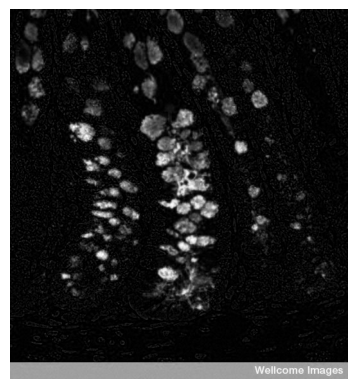

In [124]:
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.imshow(image_rgb)
plt.axis('off')


### Ex.  3 (1 pt)

What you are seeing is a fluorescent micrograph of a section of mouse colon. This structure is a colonic crypt. At the base of the crypt, there are stem cells labeled with green fluorescent protein (GFP).  The stem cells are surrounded by  goblet cells (stained in red) that secrete mucus. All the other cells are stained with DAPI, so their nuclei appear in blue. -Paraphrase from the documentation.

You are a researcher studying goblet cells. First, let's take a look at the the distribution of pixel data. Use the Code block below

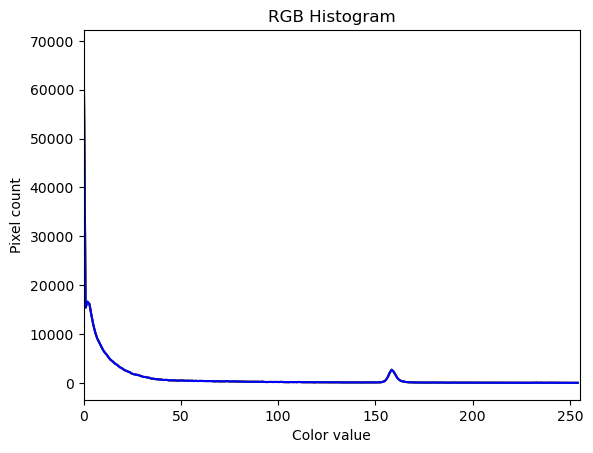

In [126]:
def histogram_rgb(image):
    color = ('r', 'g', 'b')  # Tuple to select colors of each channel line
    for i, col in enumerate(color):
        histogram, bin_edges = np.histogram(image[:, :, i], bins=256, range=(0, 255))
        plt.plot(bin_edges[0:-1], histogram, color=col)
        plt.xlim([0, 255])  # 255 instead of 256 because 0-255 has 256 values.
    plt.title('RGB Histogram')
    plt.xlabel("Color value")
    plt.ylabel("Pixel count")
    plt.show()

histogram_rgb(image_rgb) # Call your image variable here

Based on this histogram, in what value range are most of the pixels?

In [ ]:
# Most of the pixels are concentrated in the low intensity range, approximately between 0 and 50.

### Ex.  4 (1 pt)

Since you want to look at the goblet cells, use slicing to create a new array that contains only the goblet cell staining.

In [127]:
goblet = image_rgb[:, :, 0]

### Ex.  5  (1 pt)

Display your goblet cell image (array) using Matplotlib. Since this new array will not have color, use a colormap to visualize differences in pixel intesity, see [Matplotlib colormaps](https://matplotlib.org/stable/gallery/color/colormap_reference.html) for options.

(np.float64(-0.5), np.float64(525.5), np.float64(575.5), np.float64(-0.5))

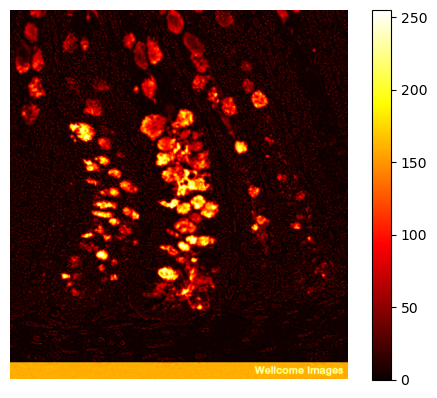

In [128]:
plt.imshow(goblet, cmap='hot')
plt.colorbar()
plt.axis('off')

### Ex.  6 (1 pt)

Let's look at a histogram of the goblet cell image and see the intensity ditribution of the pixels.

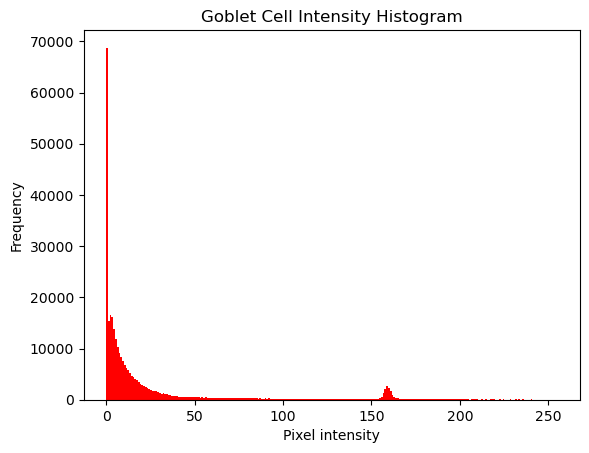

In [129]:
plt.hist(goblet.ravel(), bins=256, range=(0, 255), color='red')
plt.title('Goblet Cell Intensity Histogram')
plt.xlabel('Pixel intensity')
plt.ylabel('Frequency')
plt.show()

### Ex.  7 (1 pt)

Pick a type of thresholding filter (other than Otsu) to try from [Scikit-image](https://scikit-image.org/docs/stable/api/skimage.filters.html) or [OpenCV](https://docs.opencv.org/4.x/d7/d4d/tutorial_py_thresholding.html) and use it to create a threshold for your image.

In [ ]:


# 1 channel needed for threshold (convert from 3 channel (bgr) to 1 channel (grayscale)) 
gray_img = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
thresh_val, thresh = cv2.threshold(gray_img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_TRIANGLE)
print(thresh_val, thresh)




20.0 [[  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0   0   0]
 ...
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]]


### Ex.  8 (1 pt)

Use the threshold you selected to create a boolean mask. Display the mask with Matplotlib.

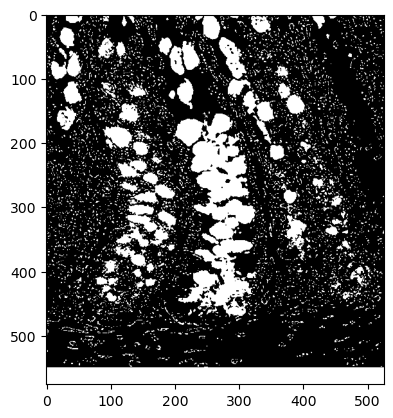

In [136]:

mask = gray_img > thresh_val
plt.imshow(mask, cmap='gray')

### Ex.  9 (2 pt)

Do you think the thresholding method you selected would work well for isolating the goblet cells? Why or why not?

In [137]:
# Yes because the goblet cells are in white and isolated but there can be issues because there are lots of small white specs as well. 